In [0]:
!pip3 install http://download.pytorch.org/whl/cu80/torch-0.3.0.post4-cp36-cp36m-linux_x86_64.whl 
!pip3 install torchvision

In [ ]:
!wget https://cdn.pixabay.com/photo/2017/02/07/16/47/kingfisher-2046453_960_720.jpg -O bird1.jpg
!wget http://www.dreams.metroeve.com/wp-content/uploads/2017/05/dreams.metroeve_face-dreams-meaning.jpg -O face1.jpg
!wget "http://epilepsyu.com/wp-content/uploads/2014/01/happy-people-1050x600.jpg" -O people.jpg
!wget "https://cdn.vox-cdn.com/thumbor/ZozzaEdjsgqUX3W-tKsqal2JXCc=/0x0:2000x1333/1200x800/filters:focal(840x507:1160x827)/cdn.vox-cdn.com/uploads/chorus_image/image/55348079/170508_10_27_41_5DS29248.0.jpg" -O building.jpg
!wget https://raw.githubusercontent.com/sar-gupta/deep-dream-pytorch/master/sky-dd.jpeg -O sky.jpg
!wget https://cars.usnews.com/static/images/Auto/izmo/i55764847/2018_ford_mustang_angularfront.jpg -O car.jpg

In [1]:
import numpy as np

import torch
from torch.autograd import Variable
from torch.optim import SGD
import torch.nn as nn
from torchvision import models, transforms

from PIL import Image, ImageFilter, ImageChops

import os
import copy
import matplotlib
import matplotlib.pyplot as plt

from matplotlib import animation

import scipy.ndimage as ndimage

%matplotlib inline

def recreate_image(im_as_var):
    reverse_mean = [-0.485, -0.456, -0.406]
    reverse_std = [1/0.229, 1/0.224, 1/0.225]
    recreated_im = copy.copy(im_as_var.data.numpy()[0])
    for c in range(3):
        recreated_im[c] /= reverse_std[c]
        recreated_im[c] -= reverse_mean[c]
    recreated_im[recreated_im > 1] = 1
    recreated_im[recreated_im < 0] = 0
    recreated_im = np.round(recreated_im * 255)

    recreated_im = np.uint8(recreated_im).transpose(1, 2, 0)
    # Convert RBG to GBR
    recreated_im = recreated_im[..., ::-1]
    recreated_im = ndimage.gaussian_filter(recreated_im, sigma=(1, 1, 0), order=0)
    return recreated_im

def preprocess_image(cv2im, resize_im=True):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    if resize_im:
        cv2im = Image.fromarray(cv2im).resize((224, 224))
    
    im_as_arr = np.float32(cv2im)
    im_as_arr = np.ascontiguousarray(im_as_arr[..., ::-1])
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Convert array to D,W,H
   
    for channel, _ in enumerate(im_as_arr):
        im_as_arr[channel] /= 255
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]
   
    im_as_ten = torch.from_numpy(im_as_arr).float()
    im_as_ten.unsqueeze_(0)
    im_as_var = Variable(im_as_ten, requires_grad=True)
    
    return im_as_var


loader = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor()
])

normalise = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

preprocess = transforms.Compose([
    loader,
    normalise
])

def deprocess(image):
    return image * torch.Tensor([0.229, 0.224, 0.225]).cuda()  + torch.Tensor([0.485, 0.456, 0.406]).cuda()

def image_loader(image_name):
    image = Image.open(image_name)
    return image

def image_to_variable(image, requires_grad = False, cuda=False):
    image = preprocess(image)
    
    if cuda:
        image = Variable(image.cuda(), requires_grad=requires_grad)
    else:
        image = Variable(image, requires_grad = requires_grad)
        
    image = image.unsqueeze(0) 
    
    return image


In [2]:
model = models.vgg16(pretrained=True)

In [3]:
print(model)

layers_num = len(list(model.features) + list(model.classifier))
print("tot layers: ", layers_num)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

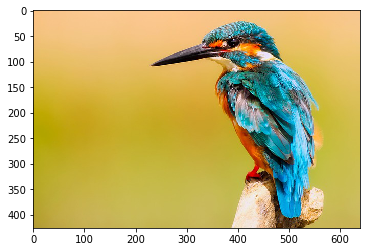

tensor([ 92])


In [4]:
image = image_loader('bird1.jpg')
plt.imshow(image)
plt.pause(0.001)
model.eval()
output = model(image_to_variable(image))
val, index = torch.max(output, 1)
print(index)

In [5]:
class CNNLayerVisualization():
    def __init__(self, model):
        self.model = model.cuda()
        self.model.eval()
        
        self.init_image()
  
    def init_image(self):
        self.created_image = np.uint8(np.full((224, 224, 3), 150))
        self.created_image = np.uint8(np.random.uniform(150, 180, (224, 224, 3)))
        
    def visualize_filter(self, layer_index, filter_index):
        self.init_image()
        self.processed_image = preprocess_image(self.created_image)
        optimizer = SGD([self.processed_image], lr=6, weight_decay=1e-6)
        
        for i in range(50):
            optimizer.zero_grad()
            x = self.processed_image
            
            for index, layer in enumerate(self.model.features):
                x = layer(x.cuda())
                if index == layer_index:
                    break
            
            output = x[0, filter_index]
            loss = torch.mean(output)
            loss.backward()
            optimizer.step()
            self.created_image = recreate_image(self.processed_image.cpu())
            # self.processed_image = preprocess_image(self.created_image)
            
        return self.created_image
    
    def get_activation(self, image, layer_index):
        input = Variable(preprocess(image).unsqueeze(0).cuda(), requires_grad=False)
        # modules = list(self.model.features.modules())
      
        out = input
        for index, layer in enumerate(list(self.model.features) + list(self.model.classifier)):
            #if index == 31:
            #    out = out.view(out.size(0), -1)
                    
            out = layer(out)

            if index == layer_index:
                break
                    
        return out
    
    def objective_guide(self, dst, guide_features):
        x = dst.data[0].cpu().numpy().copy()
        y = guide_features.data[0].cpu().numpy()
        ch, w, h = x.shape
        
        
        x = x.reshape(ch, -1)
        y = y.reshape(ch, -1)
        
        A = x.T.dot(y) # compute the matrix of dot-products with guide features
        
        result = y[:,A.argmax(1)] # select ones that match best
        result = torch.Tensor(np.array([result.reshape(ch, w, h)], dtype=np.float)).cuda()
        
        return result
        
    def max_grad(self, image, layer_index, iterations, lr, target=None):
        input = Variable(preprocess(image).unsqueeze(0).cuda(), requires_grad=True)
        #optimizer = SGD([input], lr=lr, weight_decay=1e-6)
        #criterion = nn.CrossEntropyLoss()
        
        modules = list(self.model.features.modules())
            
        for i in range(iterations):
            self.model.zero_grad()
            
            out = input
            for index, layer in enumerate(list(self.model.features) + list(self.model.classifier)):
                #if index == 31:
                #    out = out.view(out.size(0), -1)
                    
                out = layer(out)
                
                if index == layer_index:
                    break
            
            #print("Output len: " + str(out.size()))
            #print("Target len: " + str(target.size()))
                  
            if target is None:
                loss = out.norm()
                loss.backward()
            else:
                #loss = criterion(out, torch.max(Variable(target.data.cuda(), requires_grad=False), 1)[1])
                #loss.backward()
                #loss = self.objective_guide(out, target)
                #loss = (out * target.data[0]).norm()
                #loss.backward()
                
                #out.backward((out * target.data[0]).norm()) 
                out.backward(self.objective_guide(out, target))
            
            
            input.data = input.data + lr * input.grad.data
            
        input = input.data.squeeze()
        input.transpose_(0, 1)
        input.transpose_(1, 2)
        input = np.clip(deprocess(input), 0, 1)
        im = Image.fromarray(np.uint8(input * 255))
        return im
        
    def deep_dream(self, image, layer_index, iterations, lr, octave_scale, num_octaves, target=None):
        if num_octaves > 0:
            image1 = image.filter(ImageFilter.GaussianBlur(2))
            
            if image1.size[0] / octave_scale < 1 or image1.size[1] / octave_scale < 1:
                size = image1.size
            else:
                size = (int(image1.size[0] / octave_scale), int(image1.size[1] / octave_scale))
            
            image1 = image1.resize(size, Image.ANTIALIAS)
            image1 = self.deep_dream(image1, layer_index, iterations, lr, octave_scale, num_octaves - 1, target)
            size = (image.size[0], image.size[1])
            image1 = image1.resize(size, Image.ANTIALIAS)
            image = ImageChops.blend(image, image1, 0.6)
        
        result = self.max_grad(image, layer_index, iterations, lr, target)
        result = result.resize(image.size)
        return result
            



In [6]:
layer_vis = CNNLayerVisualization(model)

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


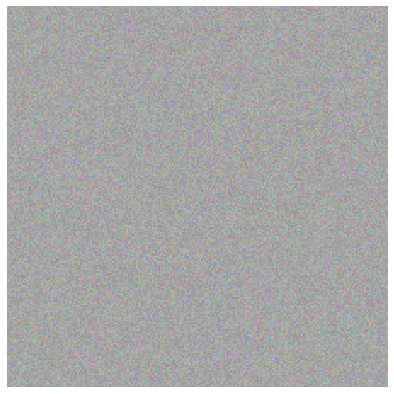

In [6]:
images = []
titles = []
gfig = plt.figure(figsize=(12, 7))
gif = plt.imshow(np.uint8(np.random.uniform(150, 180, (224, 224, 3))), animated=True)
gif.axes.get_xaxis().set_visible(False)
gif.axes.get_yaxis().set_visible(False)
gif_title = plt.axes().text(1.5, 2, '', transform = plt.axes().transAxes, horizontalalignment='center')


In [0]:
def plot_image(im, title = None):
    plt.figure(figsize=(20, 10))
    plt.imshow(im)
    plt.pause(0.001)
    
def plot_images(im, titles=None):
    plt.figure(figsize=(30, 20))
    
    for i in range(len(im)):
        plt.subplot(10 / 5 + 1, 5, i + 1)
        plt.axis('off')
        if titles is not None:
            plt.title(titles[i])
        plt.imshow(im[i])
        
    plt.pause(0.001)

def gif_init():
    global gfig
    gfig = plt.figure(figsize=(12, 7))
    git_title.set_text('')
    gif.set_data([0], [0])
    return gif, gif_title
    
def generate_gif(i):
    global images, titles, gif
    gif_title.set_text(titles[i])
    gif.set_array(images[i])
    return gif, gif_title

def show_animation():
    global gfig 
    return animation.FuncAnimation(gfig, generate_gif, init_func=gif_init, frames=10,interval=2000)

In [0]:
def show_layer(layer_num):
    images = []
    titles = []
    
    for i in range(10, 20):
        images.append(layer_vis.visualize_filter(layer_num, i))
        titles.append("Layer {} Filter {}".format(layer_num, i))
    
    plot_images(images, titles)
    return images, titles

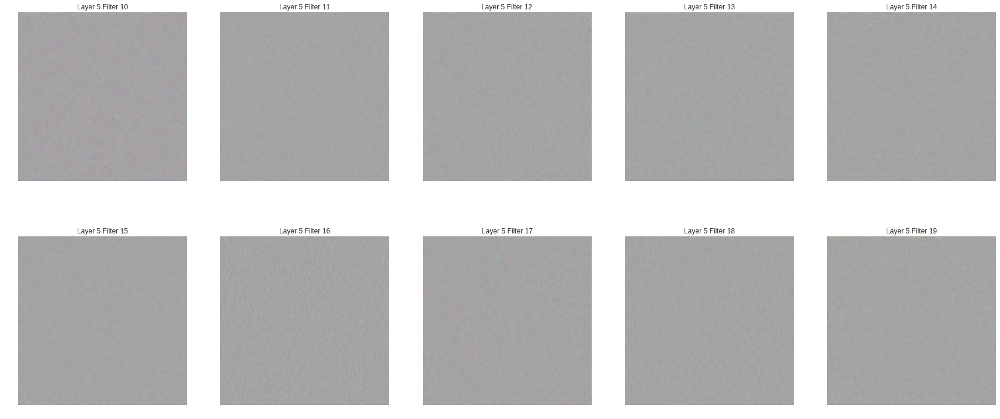

In [9]:
images, titles = show_layer(5)

In [10]:
show_animation()

In [100]:
show_animation()

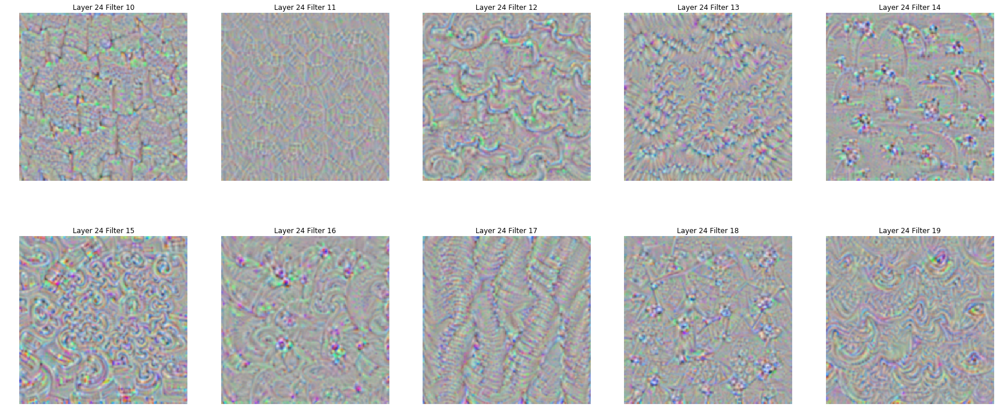

In [0]:
images, titles = show_layer(24)

In [0]:
show_animation()

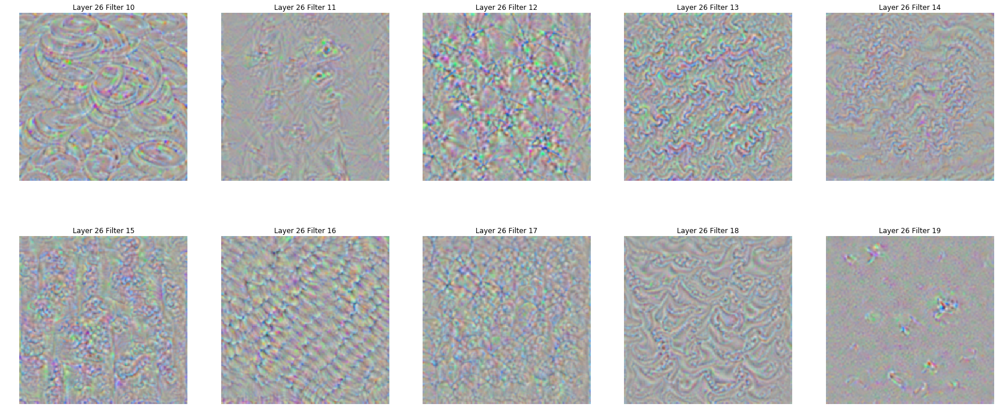

In [0]:
images, titles = show_layer(26)

In [0]:
show_animation()

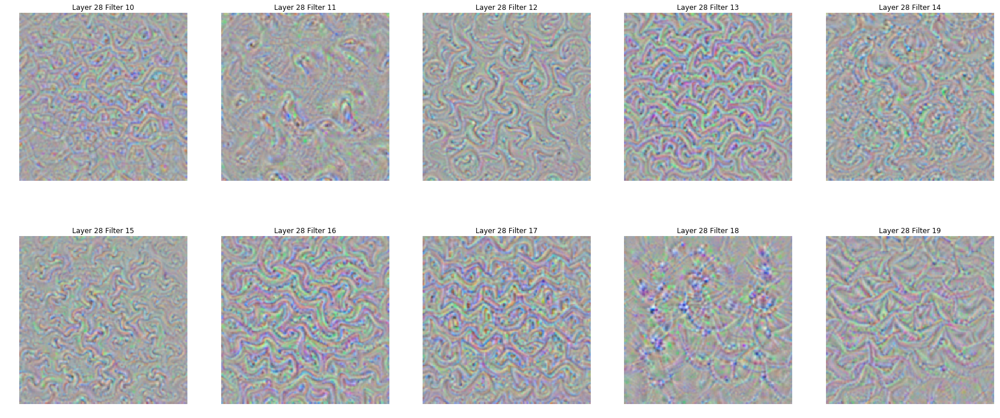

In [0]:
images, titles = show_layer(28)

In [0]:
show_animation()

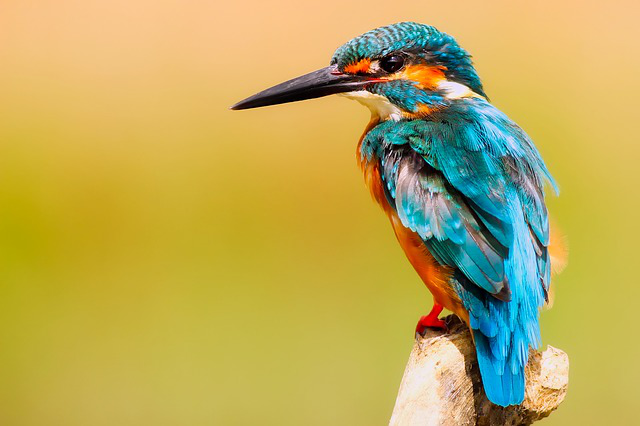

In [7]:
image = image_loader('face1.jpg')
target = layer_vis.get_activation(image, layer_index=26)
image = image_loader('bird1.jpg')
image

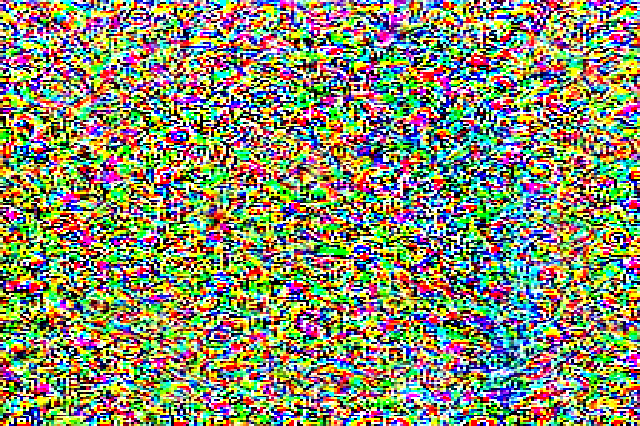

In [8]:
layer_vis.deep_dream(image, layer_index=26, iterations=2, lr=0.001, octave_scale=1, num_octaves=6, target=target)

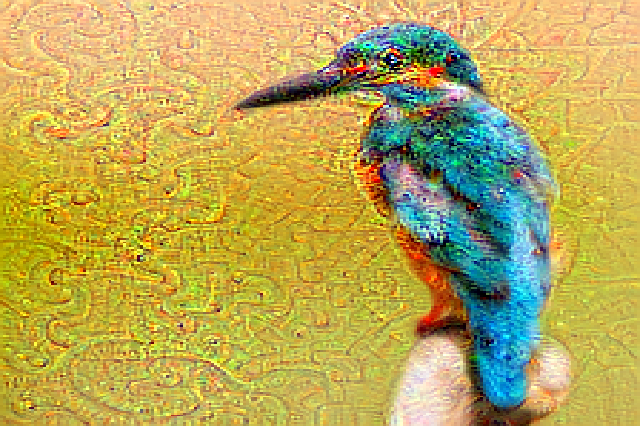

In [29]:
layer_vis.deep_dream(image, layer_index=28, iterations=2, lr=0.1, octave_scale=1, num_octaves=6)

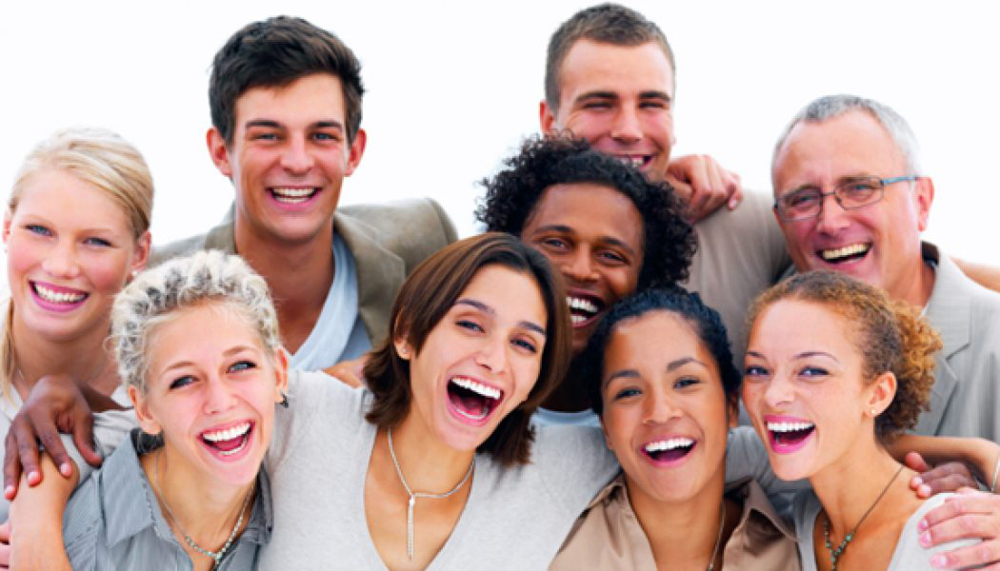

In [11]:
image = image_loader('bird1.jpg')
target = layer_vis.get_activation(image, layer_index=28)
image = image_loader('people.jpg')
image

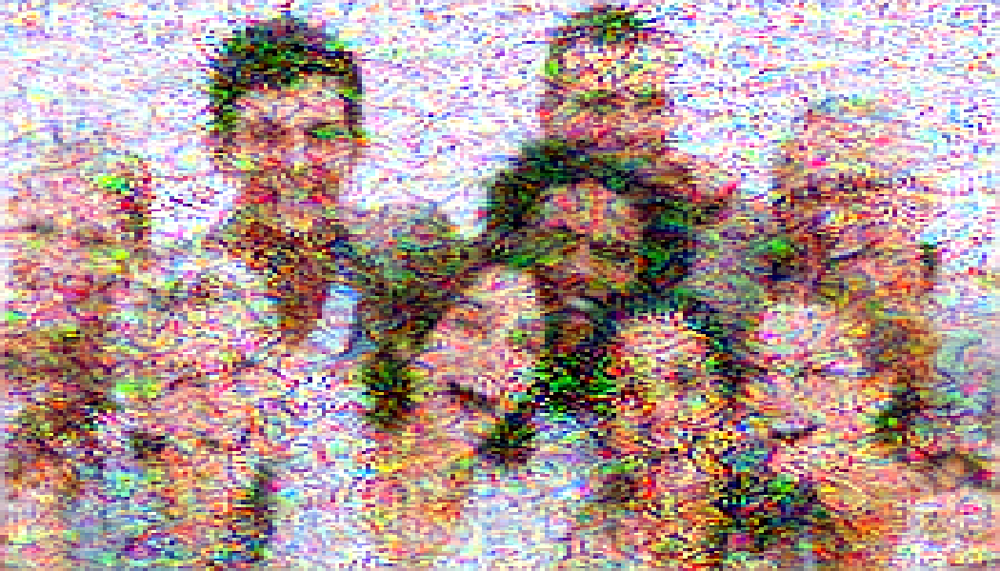

In [14]:
layer_vis.deep_dream(image, layer_index=27, iterations=5, lr=0.01, octave_scale=1.4, num_octaves=7, target=target)

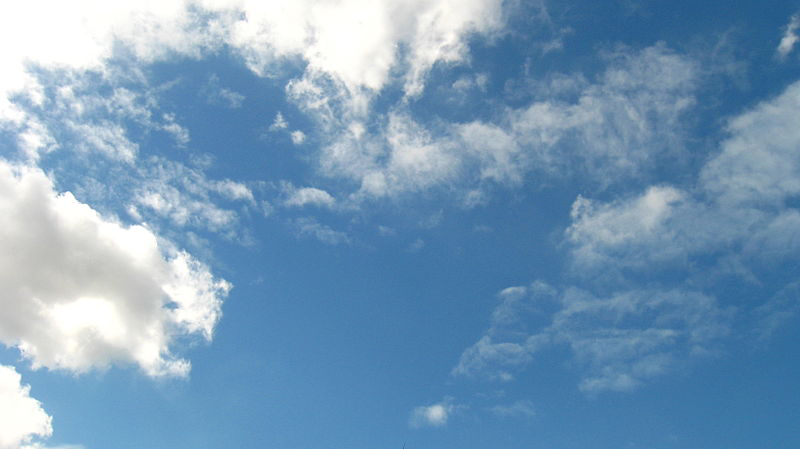

In [11]:
image = image_loader('sky.jpg')
image

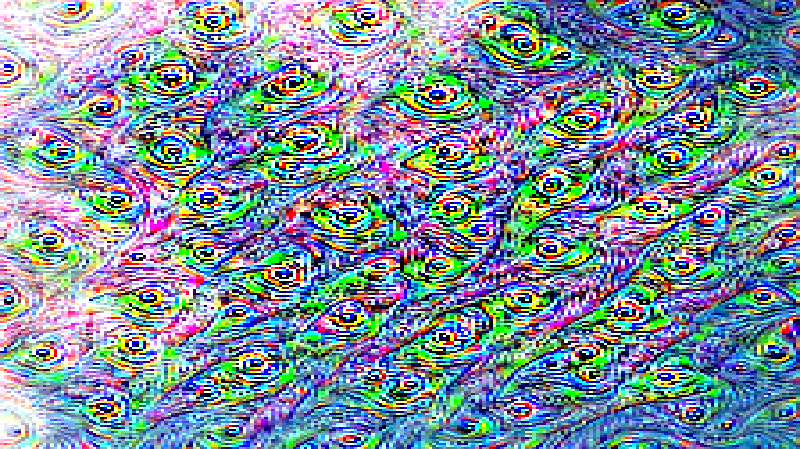

In [12]:
layer_vis.deep_dream(image, layer_index=28, iterations=5, lr=0.1, octave_scale=1, num_octaves=20)

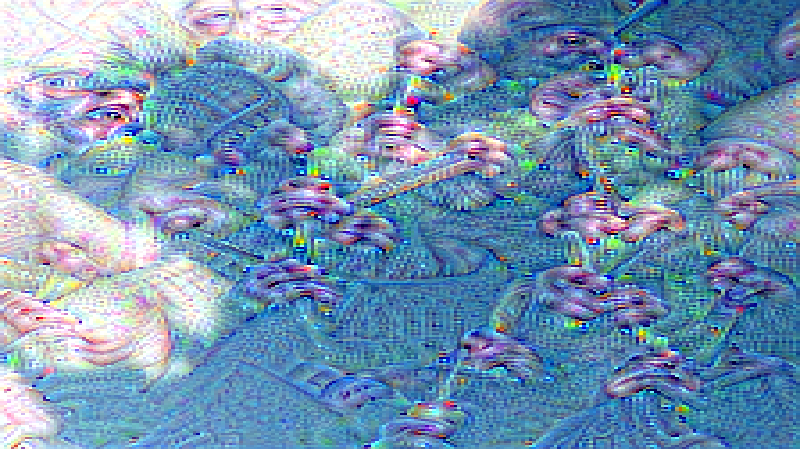

In [88]:
image = image_loader('people.jpg')
target = layer_vis.get_activation(image, layer_index=28)
image = image_loader('sky.jpg')
layer_vis.deep_dream(image, layer_index=28, iterations=5, lr=0.001, octave_scale=1, num_octaves=20, target=target)

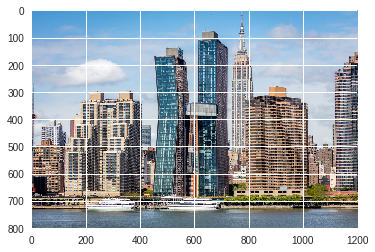

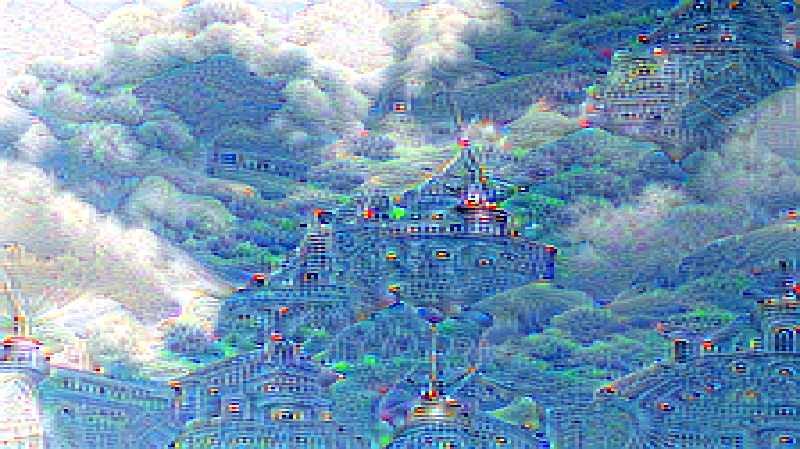

In [72]:
image = image_loader('building.jpg')
plt.imshow(image)
plt.pause(0.001)
target = layer_vis.get_activation(image, layer_index=28)
image = image_loader('sky.jpg')
layer_vis.deep_dream(image, layer_index=28, iterations=5, lr=0.001, octave_scale=1, num_octaves=20, target=target)

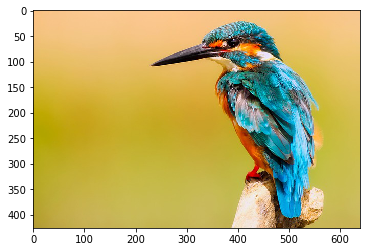

Target shape: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size(

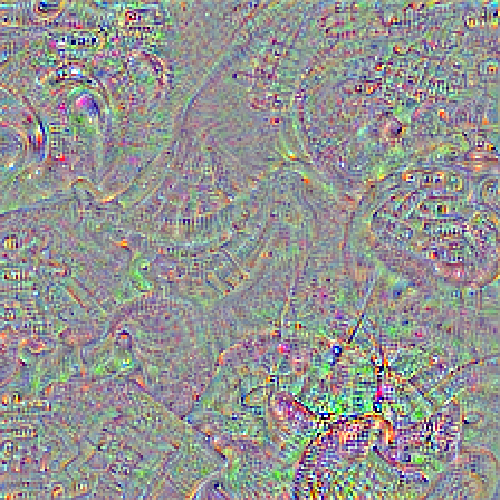

In [33]:
image = image_loader('bird1.jpg')
plt.imshow(image)
plt.pause(0.001)
target = layer_vis.get_activation(image, layer_index=40)
print("Target shape: " + str(target.size()))

image = Image.fromarray(np.uint8(np.full((500, 500, 3), 150)))
layer_vis.deep_dream(image, layer_index=40, iterations=5, lr=5, octave_scale=1, num_octaves=6, target=target)

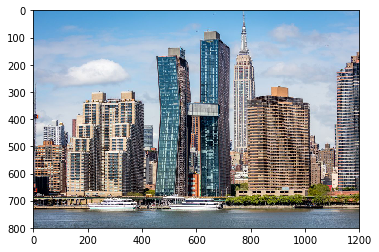

Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1, 512, 7, 7])
Output len: torch.Size([1, 512, 7, 7])
Target len: torch.Size([1

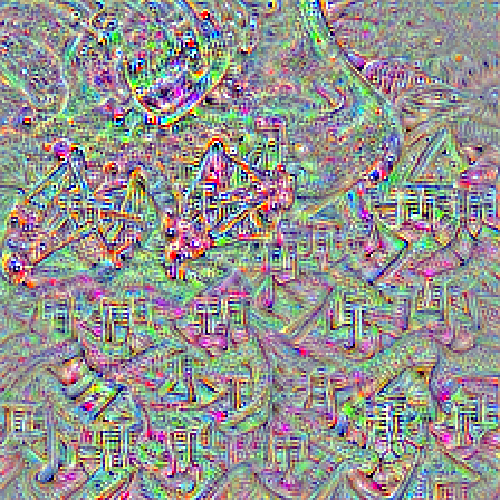

In [34]:
image = image_loader('building.jpg')
plt.imshow(image)
plt.pause(0.001)
target = layer_vis.get_activation(image, layer_index=50)
image = Image.fromarray(np.uint8(np.full((500, 500, 3), 150)))
layer_vis.deep_dream(image, layer_index=50, iterations=5, lr=7, octave_scale=1, num_octaves=20, target=target)

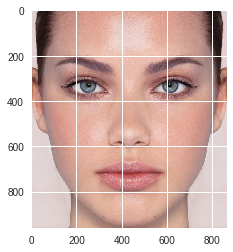

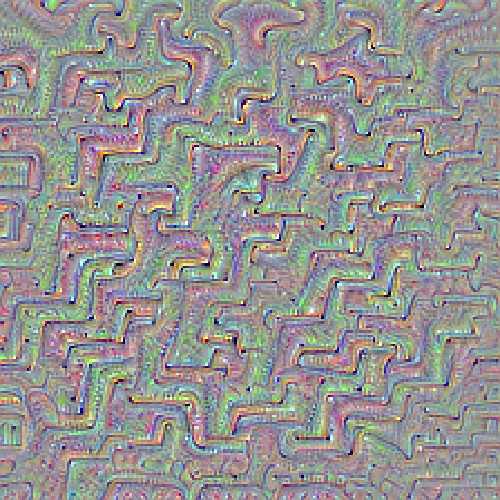

In [76]:
image = image_loader('face1.jpg')
plt.imshow(image)
plt.pause(0.001)
target = layer_vis.get_activation(image, layer_index=28)
image = Image.fromarray(np.uint8(np.full((500, 500, 3), 150)))
layer_vis.deep_dream(image, layer_index=28, iterations=5, lr=0.001, octave_scale=1, num_octaves=20, target=target)

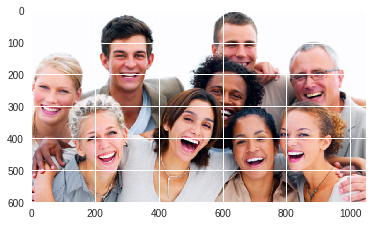

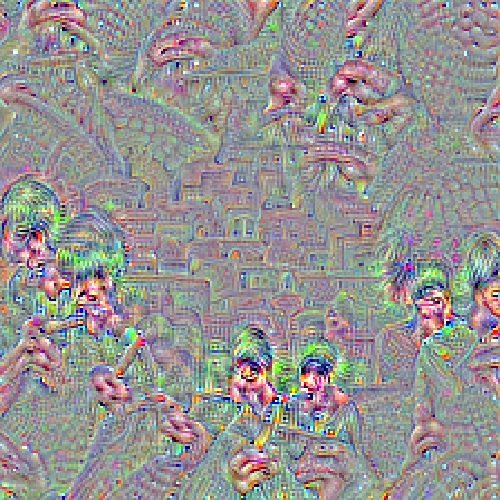

In [77]:
image = image_loader('people.jpg')
plt.imshow(image)
plt.pause(0.001)
target = layer_vis.get_activation(image, layer_index=28)
image = Image.fromarray(np.uint8(np.full((500, 500, 3), 150)))
layer_vis.deep_dream(image, layer_index=28, iterations=5, lr=0.001, octave_scale=1, num_octaves=20, target=target)

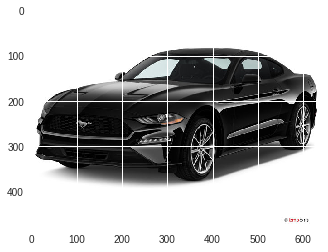

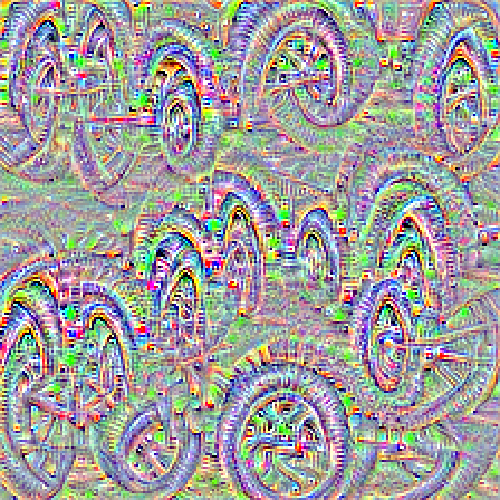

In [83]:
image = image_loader('car.jpg')
plt.imshow(image)
plt.pause(0.001)
target = layer_vis.get_activation(image, layer_index=28)
image = Image.fromarray(np.uint8(np.random.uniform(150, 180, (500, 500, 3))))
layer_vis.deep_dream(image, layer_index=28, iterations=5, lr=0.001, octave_scale=1, num_octaves=20, target=target)

## Deep Dream

In [ ]:
def objective_L2(dst, guide_features):
    return dst.data

def make_step(img, model, control=None, distance=objective_L2):
    mean = np.array([0.485, 0.456, 0.406]).reshape([3, 1, 1])
    std = np.array([0.229, 0.224, 0.225]).reshape([3, 1, 1])
    
    learning_rate = 2e-2
    max_jitter = 32
    num_iterations = 20
    show_every = 10
    end_layer = 3
    guide_features = control
    
    for i in range(num_iterations):
        shift_x, shift_y = np.random.randint(-max_jitter, max_jitter + 1, 2)
        img = np.roll(np.roll(img, shift_x, -1), shift_y, -2)
        
        model.zero_grad()
        img_tensor = torch.Tensor(img, requires_grad=True).cuda()
        
        act_value = model.forward(img_variable, end_layer)
        diff_out = distance(act_value, guide_features)
        ratio = np.abs(img_variable.grad.data.cpu().numpy()).mean()
        learning_rate_use = learning_rate / ratio
        img_variable.data.add_(img_variable.grad.data * learning_rate_use)
        img = img_variable.data.cpu().numpy()  # b, c, h, w
        img = np.roll(np.roll(img, -shift_x, -1), -shift_y, -2)
        img[0, :, :, :] = np.clip(img[0, :, :, :], -mean / std, (1 - mean) / std)
    
    return img
        
    
def dream(model, base_img, octave_n=6, octave_scale=1.4, control=None, distance=objective_L2):
    octaves = [base_img]
    
    for i in range(octave_n - 1):
        octaves.append(nd.zoom(
                octaves[-1], 
                (1, 1, 1.0 / octave_scale, 1.0 / octave_scale),
                order=1
        ))

    detail = np.zeros_like(octaves[-1])
    for octave, octave_base in enumerate(octaves[::-1]):
        h, w = octave_base.shape[-2:]
        if octave > 0:
            h1, w1 = detail.shape[-2:]
            detail = nd.zoom(
                detail, (1, 1, 1.0 * h / h1, 1.0 * w / w1), order=1)

        input_oct = octave_base + detail
        print(input_oct.shape)
        out = make_step(input_oct, model, control, distance=distance)
        detail = out - octave_base